In [1]:
from skimage.transform import rescale, AffineTransform, warp
from astropy.coordinates import EarthLocation,SkyCoord
from datetime import date, datetime,timedelta
import sunpy.visualization.colormaps as cm
from sunpy.net import Fido, attrs as SAF
from  scipy.stats.stats import pearsonr
from skimage.metrics import structural_similarity as ssim
from sunpy.coordinates import RotatedSunFrame
import sunpy.coordinates.frames as f
import matplotlib.pyplot as plt
import scipy.ndimage as scnd
from astropy.io import fits
import astropy.units as u
from scipy import signal
from useful_functions import *  #file where is some usefulls functions 
import numpy as np
import sunpy.map
import matplotlib
import warnings
import salat
import glob
from tqdm import tqdm
import os
warnings.filterwarnings("ignore")

/tmp/ipykernel_28232/728190577.py:6: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from  scipy.stats.stats import pearsonr


In [3]:
path_ALMA='/media/javier/SSD_2/D06_region/datos_SDO-completos_IRIS_ALMA/ALMA_data/{}'
file=path_ALMA.format('D06_solaralma.b3.fba.20180412_155228-162441.2017.1.00653.S.level4.k.fits')
almacube, header, timesec, timeutc, beammajor, beamminor, beamangle = salat.read(file,timeout=True,beamout=True,
                                                                                 HEADER=True,SILENT=False,fillNan=True)


---------------------------------------------------
--------------- SALAT READ part of ----------------
-- Solar Alma Library of Auxiliary Tools (SALAT) --

Reading ALMA cube



100%|████████████████████████████████████| 1608/1608 [00:00<00:00, 36633.47it/s]


Do you want to fill NaN with data median? (y/n):  y


---------------------------------------------------
--------------- SALAT INFO part of ----------------
-- Solar Alma Library of Auxiliary Tools (SALAT) --


----------------------------------------------
| Data feat.: 
----------------------------------------------
|  ALMA BAND:  3
|  Obs. Date:  2018-04-12
|  ALMA proj:  2017.1.00653.S
|  Pix. Unit:  K
|  Pix. Size:  0.3  arcsec.
|  Beam mean:  2.15798  arcsec
|  FOV. diam:  notcomputed
----------------------------------------------
| Data range 
----------------------------------------------
|  Min =  5260.81054688  Kelvin
|  Max =  10677.8203125  Kelvin
----------------------------------------------

Done!


In [4]:
# Rotating ALMA cube
alma_rote=fun_alma_rotate(almacube,header)
# Reading IRIS FILE 
path='/media/javier/SSD_2/D06_region/datos_SDO-completos_IRIS_ALMA/IRIS_data/{}'
iris_2796=fits.open(path.format('iris_l2_20180412_130937_3640258010_SJI_2796_t000.fits'))
iris_1330=fits.open(path.format('iris_l2_20180412_130937_3640258010_SJI_1330_t000.fits'))
iris_1400=fits.open(path.format('iris_l2_20180412_130937_3640258010_SJI_1400_t000.fits'))
iris_2832=fits.open(path.format('iris_l2_20180412_130937_3640258010_SJI_2832_t000.fits'))

rescaling_iris_2796 = iris_rescale(iris_2796,0.3)
rescaling_iris_2832 = iris_rescale(iris_2832,0.3)
rescaling_iris_1400 = iris_rescale(iris_1400,0.3)
rescaling_iris_1330 = iris_rescale(iris_1330,0.3)
aperture            = aperture_circ_ALMA(almacube)

Rotating ALMA cube


100%|██████████████████████████████████████| 1608/1608 [00:11<00:00, 136.62it/s]


rotate angle -26.1446
______________________________________________________
initial shape: (950, 774, 735)
scale_factor: 0.5545


100%|████████████████████████████████████████| 950/950 [00:02<00:00, 386.66it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
initial shape: (950, 774, 735)
scale_factor: 0.5545


100%|████████████████████████████████████████| 950/950 [00:03<00:00, 238.08it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
initial shape: (950, 774, 735)
scale_factor: 0.5545


100%|████████████████████████████████████████| 950/950 [00:02<00:00, 403.14it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
initial shape: (950, 774, 735)
scale_factor: 0.5545


100%|████████████████████████████████████████| 950/950 [00:02<00:00, 398.31it/s]


______________________________________________________
final shape: (950, 429, 408)


In [5]:
#  -----SDO CUBOS DE DATOS ROTADOS------

path_sdo_rot = '/home/javier/Documents/MSc-program/SDO_DATA_ALIGNIING/SDO_data_crop_and_rotate/{}'

cubo_211 = np.load(path_sdo_rot.format('crop_and_rotate_AIA211.npy'),allow_pickle=True).astype(np.float32)   
time_211 = np.load(path_sdo_rot.format('cuboAIA_timeUTC_AIA211.npy'),  allow_pickle=True)

cubo_304 = np.load(path_sdo_rot.format('crop_and_rotate_AIA304.npy'), allow_pickle=True).astype(np.float32)   
time_304 = np.load(path_sdo_rot.format('cuboAIA_timeUTC_AIA304.npy'),  allow_pickle=True)

cubo_171 = np.load(path_sdo_rot.format('crop_and_rotate_AIA171.npy'), allow_pickle=True).astype(np.float32)                   
time_171 = np.load(path_sdo_rot.format('cuboAIA_timeUTC_AIA171.npy'),  allow_pickle=True)

cubo_hmi = np.load(path_sdo_rot.format('crop_and_rotate_HMI_MAGT.npy'), allow_pickle=True)
time_hmi = np.load(path_sdo_rot.format('cuboHMI_MAGT_timeUTC.npy'), allow_pickle=True)            

df_resolution={'AIA94'  : 0.600109,'AIA131' : 0.600698, 
               'AIA171' : 0.599489,'AIA193' : 0.600714,
               'AIA211' : 0.600758,'AIA304' : 0.600165,
               'AIA335' : 0.600737,'AIA1600': 0.609373,
               'AIA1700': 0.612898, 'HMI'   : 0.504349}

rescaling_cubo_171   = sdo_rescale(cubo_171 ,df_resolution['AIA171'] ,0.3)
rescaling_cubo_211   = sdo_rescale(cubo_211 ,df_resolution['AIA211'] ,0.3)
rescaling_cubo_304   = sdo_rescale(cubo_304 ,df_resolution['AIA304'] ,0.3)
rescaling_cubo_hmi   = sdo_rescale(cubo_hmi ,df_resolution['HMI']    ,0.3)

scale_factor: 1.9982966666666668


100%|█████████████████████████████████████████| 275/275 [00:02<00:00, 92.98it/s]


________________________________________________________________________
initial shape: (275, 470, 471) | rescaled shape: (275, 939, 941)
scale_factor: 2.002526666666667


100%|█████████████████████████████████████████| 275/275 [00:02<00:00, 96.45it/s]


________________________________________________________________________
initial shape: (275, 469, 470) | rescaled shape: (275, 939, 941)
scale_factor: 2.00055


100%|█████████████████████████████████████████| 275/275 [00:02<00:00, 95.34it/s]


________________________________________________________________________
initial shape: (275, 471, 470) | rescaled shape: (275, 942, 940)
scale_factor: 1.6811633333333336


100%|███████████████████████████████████████████| 73/73 [00:00<00:00, 79.75it/s]

________________________________________________________________________
initial shape: (73,) | rescaled shape: (73,)


In [69]:
files=sorted(glob.glob('/home/javier/Documents/MSc-program/SDO_DATA_ALIGNIING/SDO/171/crop_and_rotate/*.fits'))
n_0_171, n_f_171=find_nearest(time_171, timeutc[0], timeutc[-1], 'AIA 171', 'ALMA')
n_0_171, n_f_171=find_nearest(time_171, timeutc[0], timeutc[-1], 'AIA 171', 'ALMA')
n_0_211, n_f_211=find_nearest(time_211, timeutc[0], timeutc[-1], 'AIA 211', 'ALMA')
n_0_304, n_f_304=find_nearest(time_304, timeutc[0], timeutc[-1], 'AIA 304', 'ALMA')

aia_rot     = sunpy.map.Map(files)[n_0_171]
scale_sdo   = 2
c_iris      = SkyCoord(Tx=-132.42* u.arcsec , Ty=-401.77*u.arcsec, frame=aia_rot.coordinate_frame)
c_sdo       = SkyCoord(Tx=-131.5712* u.arcsec, Ty=-400.6125* u.arcsec, frame=aia_rot.coordinate_frame)
aia_rot.world_to_pixel(c_iris).x.value*scale_sdo ,aia_rot.world_to_pixel(c_iris).y.value*scale_sdo

______________________________________________________
t_0_AIA 171 = 2018-04-12 15:52:33.350000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_AIA 171 = 2018-04-12 16:24:45.350000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 85 | posicion_n_f: 246
______________________________________________________
______________________________________________________
t_0_AIA 211 = 2018-04-12 15:52:33.630000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_AIA 211 = 2018-04-12 16:24:45.630000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 85 | posicion_n_f: 246
______________________________________________________
______________________________________________________
t_0_AIA 304 = 2018-04-12 15:52:29.140000
t_0_ALMA= 2018-04-12 15:52:31.992187
_________________________________________

(455.3941890034811, 463.3472030849041)

In [19]:
#-----------HMI--------------
n_0_hmi, n_f_hmi=find_nearest(time_hmi, timeutc[0], timeutc[-1], 'HMI', 'ALMA')

scale_hmi = df_resolution['HMI']/0.3
hmi_rot   = sunpy.map.Map('/home/javier/Documents/MSc-program/SDO_DATA_ALIGNIING/SDO/magt/crop_and_rotate/*.fits')[n_0_hmi]

#----Helioprojective coordinate obtained by aligning IRIS with SDO-----
c_iris      = SkyCoord(Tx=-132.42* u.arcsec  , Ty=-401.77*u.arcsec, frame=aia_rot.coordinate_frame)
#----Helioprojective coordinate obtained by aligning SDO with ALMA-----
c_sdo       = SkyCoord(Tx=-131.5712* u.arcsec, Ty=-400.6125* u.arcsec, frame=aia_rot.coordinate_frame)

hmi_rot.world_to_pixel(c_iris).x.value*scale_hmi ,hmi_rot.world_to_pixel(c_iris).y.value*scale_hmi
#hmi_rot.world_to_pixel(c_sdo).x.value*scale_hmi ,hmi_rot.world_to_pixel(c_sdo).y.value*scale_hmi


______________________________________________________
t_0_HMI = 2018-04-12 15:52:16.700001
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_HMI = 2018-04-12 16:24:31.700001
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 22 | posicion_n_f: 65
______________________________________________________


(451.08715558654507, 462.08049298063025)

In [65]:
"""
# ----------------------NOTE-----------------------

"""
time_vec_iris = creating_time_vector(iris_2796)
n_0_IRIS_ALMA, n_f_IRIS_ALMA=find_nearest(time_vec_iris, timeutc[0], timeutc[-1], 'AIA 304', 'ALMA')

x_cen, y_cen  = iris_2796[0].data.shape[2]/2, iris_2796[0].data.shape[1]/2
x_ref, y_ref  = -133.6165103130042, -397.4176236454267

x_bottom_left = x_ref-(x_cen)*iris_2796[0].header['CDELT1']
x_top_right   = x_ref+(x_cen)*iris_2796[0].header['CDELT1']
y_bottom_left = y_ref-(y_cen)*iris_2796[0].header['CDELT1']
y_top_right   = y_ref+(y_cen)*iris_2796[0].header['CDELT1']
extent_iris   = [x_bottom_left,x_top_right, y_bottom_left, y_top_right]



In [68]:
vmin_2796 = np.percentile(rescaling_iris_2796,11) 
vmax_2796 = np.percentile(rescaling_iris_2796,95) 

vmin_2832 = np.percentile(rescaling_iris_2832,11) 
vmax_2832 = np.percentile(rescaling_iris_2832,95) 

vmin_1400 = np.percentile(rescaling_iris_1400,12) 
vmax_1400 = np.percentile(rescaling_iris_1400,95) 

vmin_1330 = np.percentile(rescaling_iris_1330,12) 
vmax_1330 = np.percentile(rescaling_iris_1330,98)

vmin_171,  vmax_171  = np.percentile(rescaling_cubo_171,11) , np.percentile(rescaling_cubo_171,95) 
vmin_211,  vmax_211  = np.percentile(rescaling_cubo_211,11) , np.percentile(rescaling_cubo_211,95) 
vmin_304,  vmax_304  = np.percentile(rescaling_cubo_304,11) , np.percentile(rescaling_cubo_304,95) 


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


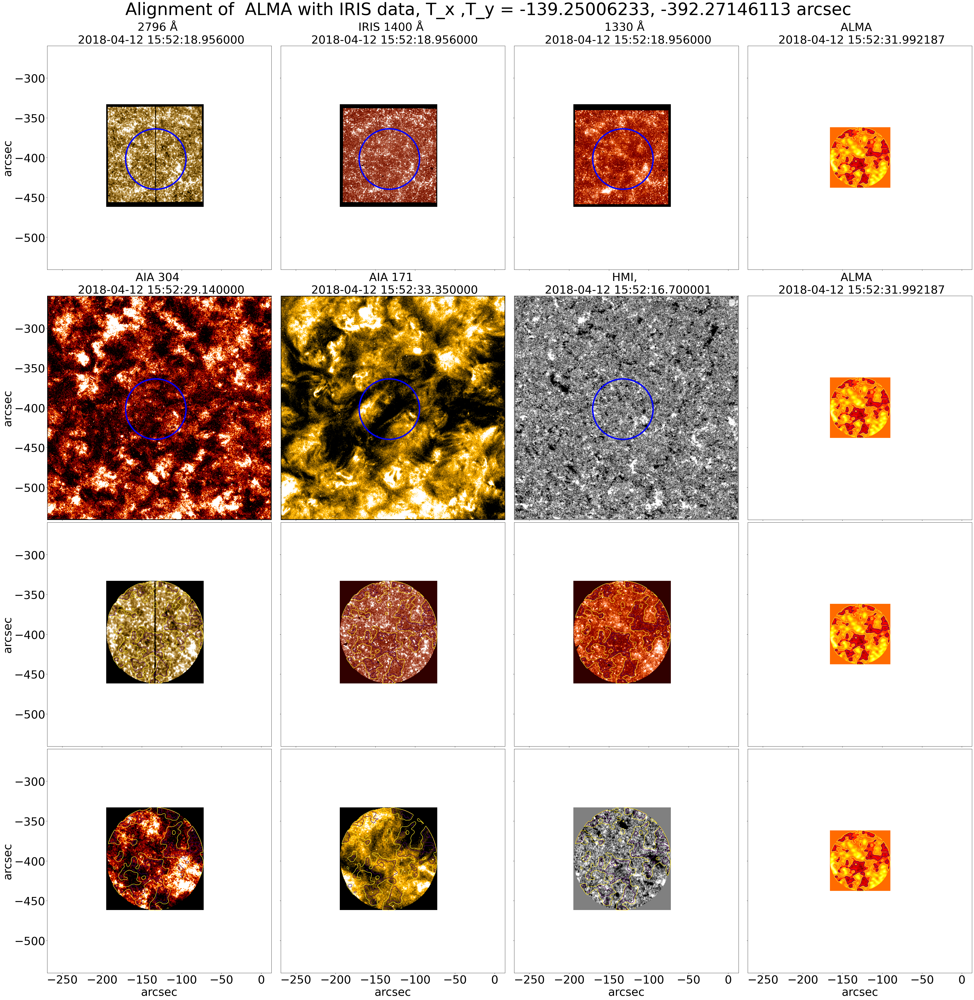

In [73]:
# ------------------------ PLOT'S PARAMETERS--------------------------------------
n_0_alma     , n_f_alma      = 0, len(almacube)

par_alma=0
par_iris= n_0_IRIS_ALMA
par_hmi = n_0_hmi
par_aia = n_0_171

fig, ax=plt.subplots(figsize=(48,48), dpi=100, ncols=4, nrows=4,  constrained_layout=True,sharex=True, sharey=True,gridspec_kw = {'wspace':0, 'hspace':0})

fontsize_word=40

extent_iris = [x_bottom_left,x_top_right, y_bottom_left, y_top_right]
cord_pix_iris_x, cord_pix_iris_y = -132.42, -401.77
radio=(253/2)*0.3

pix_ref_x,pix_ref_y=round(253/2), round(253/2)
extent_alma = [-128-pix_ref_x*0.3, -128+(253-pix_ref_x)*0.3, -400-pix_ref_y*0.3 , -400+(253-pix_ref_y)*0.3]
extent_aia  = [aia_rot.bottom_left_coord.Tx.value , aia_rot.top_right_coord.Tx.value , aia_rot.bottom_left_coord.Ty.value ,aia_rot.top_right_coord.Ty.value]
extent_hmi  = [hmi_rot.bottom_left_coord.Tx.value , hmi_rot.top_right_coord.Tx.value , hmi_rot.bottom_left_coord.Ty.value ,hmi_rot.top_right_coord.Ty.value]


#--------------------- -----------ALMA PLOTS ----------------------------------------------
ax[0,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[0,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
ax[0,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

ax[1,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[1,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
ax[1,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

ax[2,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[2,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
#ax[2,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

ax[3,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[3,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
#ax[3,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

#-------------------------------------------------------------------------------------------



ax[0,0].set_title('2796 Å \n {}'.format(time_vec_iris[par_iris]),fontsize = fontsize_word)
ax[0,0].imshow(rescaling_iris_2796[par_iris],origin='lower',cmap='irissji2796',
               vmin=vmin_2796 , vmax=vmax_2796,extent=extent_iris)

curculo_3=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'), radio,ec='blue', fc='none',lw=5)
ax[0,0].add_patch(curculo_3)
ax[0,0].scatter(cord_pix_iris_x, cord_pix_iris_y,s=30, c='black', marker='o', label='Center FoV Pearson_meth')

ax[0,1].set_title('IRIS 1400 Å \n {}'.format(time_vec_iris[par_iris]),fontsize = fontsize_word)
ax[0,1].imshow(rescaling_iris_1400[par_iris],origin='lower',cmap='irissji1400',
               vmin=vmin_1400 , vmax=vmax_1400,extent=extent_iris)
curculo_3=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'), radio,ec='blue', fc='none',lw=5)
ax[0,1].add_patch(curculo_3)


ax[0,2].set_title('1330 Å \n {}'.format(time_vec_iris[par_iris]),fontsize = fontsize_word)
ax[0,2].imshow(rescaling_iris_1330[par_iris],origin='lower',cmap='irissji1330',
               vmin=vmin_1330 , vmax=vmax_1330,extent=extent_iris)
curculo_3=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[0,2].add_patch(curculo_3)

#---------------------------------- SDO ---------------------------------------------------

ax[1,0].set_title('AIA 304 \n {}'.format(time_304[par_aia]),fontsize = fontsize_word)
ax[1,0].imshow(rescaling_cubo_304[par_aia],extent=extent_aia
          ,cmap='sdoaia304', origin='lower',vmin=vmin_304, vmax=vmax_304)

curculo_1=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[1,0].add_patch(curculo_1)


ax[1,1].set_title('AIA 171 \n {}'.format(time_171[par_aia]),fontsize = fontsize_word)
ax[1,1].imshow(rescaling_cubo_171[par_aia],extent=extent_aia
          ,cmap='sdoaia171', origin='lower',vmin=vmin_171, vmax=vmax_171)

curculo_1=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[1,1].add_patch(curculo_1)



ax[1,2].set_title('HMI, \n {}'.format(time_hmi[par_hmi]),fontsize = fontsize_word)
ax[1,2].imshow(rescaling_cubo_hmi[par_hmi],cmap='gray', origin='lower',vmin=-20,vmax=20,extent=extent_hmi)
curculo_1=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[1,2].add_patch(curculo_1)
ax[1,2].legend(prop={"size":26})



x_max_iris, y_max_iris=  int(207.5), int(203)
y_new_i_iris=int(y_max_iris-253/2)
y_new_f_iris=int(y_max_iris+253/2)
x_new_i_iris=int(x_max_iris-253/2)
x_new_f_iris=int(x_max_iris+253/2)

extent_new=extent_iris

ax[2,0].imshow(rescaling_iris_2796[par_iris][y_new_i_iris:y_new_f_iris, x_new_i_iris:x_new_f_iris]*aperture,origin='lower',cmap='irissji2796',
               vmin=vmin_2796 , vmax=vmax_2796,extent=extent_new)
ax[2,0].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[2,1].imshow(rescaling_iris_1400[par_iris][y_new_i_iris:y_new_f_iris, x_new_i_iris:x_new_f_iris]*aperture,origin='lower',
               vmin=vmin_1400 , vmax=vmax_1400 ,cmap='irissji1400',extent=extent_new)
ax[2,1].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[2,2].imshow(rescaling_iris_1330[par_iris][y_new_i_iris:y_new_f_iris, x_new_i_iris:x_new_f_iris]*aperture,origin='lower',
               vmin=vmin_1330 , vmax=vmax_1330,cmap='irissji1330',extent=extent_new)
ax[2,2].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

#----------------------------------------------------------------------------------


x_max_sdo, y_max_sdo = round(154.61035352675168), round(217.03540460983186)

y_new_i_sdo=int(y_max_sdo-253/2)
y_new_f_sdo=int(y_max_sdo+253/2)
x_new_i_sdo=int(x_max_sdo-253/2)
x_new_f_sdo=int(x_max_sdo+253/2)


ax[3,0].imshow(rescaling_cubo_304[par_aia][y_new_i_sdo:y_new_f_sdo, x_new_i_sdo:x_new_f_sdo]*aperture
          ,cmap='sdoaia304', origin='lower',vmin=vmin_304, vmax=vmax_304,extent=extent_new)
ax[3,0].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[3,1].imshow(rescaling_cubo_171[par_aia][y_new_i_sdo:y_new_f_sdo, x_new_i_sdo:x_new_f_sdo]*aperture
          ,cmap='sdoaia171', origin='lower',vmin=vmin_171, vmax=vmax_171,extent=extent_new)
ax[3,1].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[3,2].imshow(rescaling_cubo_hmi[par_hmi][y_new_i_sdo:y_new_f_sdo, x_new_i_sdo:x_new_f_sdo]*aperture
          ,cmap='gray', origin='lower',vmin=-20,vmax=20,extent=extent_new)

ax[3,2].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[0,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[0,0].tick_params(axis="y", labelsize= fontsize_word)
ax[1,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[1,0].tick_params(axis="y", labelsize= fontsize_word)
ax[2,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[2,0].tick_params(axis="y", labelsize= fontsize_word)
ax[3,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[3,0].tick_params(axis="y", labelsize= fontsize_word)
ax[3,0].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,0].tick_params(axis="x", labelsize= fontsize_word)
ax[3,1].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,1].tick_params(axis="x", labelsize= fontsize_word)
ax[3,2].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,2].tick_params(axis="x", labelsize= fontsize_word)
ax[3,3].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,3].tick_params(axis="x", labelsize= fontsize_word)


sub_title=fig.suptitle('Alignment of  ALMA with IRIS data, T_x ,T_y = -139.25006233, -392.27146113 arcsec',fontsize = fontsize_word+20, y=1.02)
#plt.tight_layout()
plt.savefig('_aling_with_iris_.jpg',dpi=200, bbox_extra_artists=(sub_title,), bbox_inches="tight")